### Step 1: Importing Libraries
We begin by importing essential Python libraries. Pandas is used for data manipulation, NumPy for numerical operations, Matplotlib and Seaborn for plotting and visualization. These libraries are foundational for any data analysis in Python.


In [31]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

### Step 2: Configure Display Settings
To improve the readability of DataFrame outputs, we configure Pandas display settings. This ensures all columns are visible and floating point numbers are formatted for clarity.


In [33]:
# Set display options for better visualization
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
pd.set_option('display.float_format', '{:.2f}'.format)

### Step 3: Load Dataset
We load the dataset `Viral_Social_Media_Trends.csv`, which contains records of viral social media posts across multiple platforms. This data will be the foundation for all subsequent analysis.


### DATA UNDERSTANDING AND CLEANING PROCESS FOR VIRAL SOCIAL MEDIA TRENDS DATASET

In [36]:
# Load the dataset
df = pd.read_csv('Viral_Social_Media_Trends.csv')

### Viewing Basic Dataset Information

This block uses `df.info()` to print an overview of the dataset, including:
- Column names
- Data types
- Non-null value counts

This provides a quick assessment of data completeness and helps verify that each column is formatted appropriately for analysis.


In [38]:
# Basic information about the dataset
print("Dataset Information:")
print(df.info())

Dataset Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Post_ID           5000 non-null   object
 1   Platform          5000 non-null   object
 2   Hashtag           5000 non-null   object
 3   Content_Type      5000 non-null   object
 4   Region            5000 non-null   object
 5   Views             5000 non-null   int64 
 6   Likes             5000 non-null   int64 
 7   Shares            5000 non-null   int64 
 8   Comments          5000 non-null   int64 
 9   Engagement_Level  5000 non-null   object
dtypes: int64(4), object(6)
memory usage: 390.8+ KB
None


### Statistical Summary of Numerical Data

This block uses `df.describe()` to generate summary statistics for all numeric columns in the dataset. It includes:
- Count, mean, standard deviation
- Minimum, maximum
- 25th, 50th (median), and 75th percentiles

This provides a foundational understanding of how key metrics like views, likes, shares, and comments are distributed, and helps identify potential outliers or skewness.


In [44]:
# Statistical summary
print("\nStatistical Summary:")
print(df.describe())


Statistical Summary:
           Views     Likes   Shares  Comments
count    5000.00   5000.00  5000.00   5000.00
mean  2494066.44 251475.03 50519.56  24888.39
std   1459489.82 144349.58 29066.36  14284.50
min      1266.00    490.00    52.00     18.00
25%   1186207.25 126892.25 25029.00  12305.25
50%   2497373.00 249443.00 50839.50  25004.00
75%   3759781.00 373970.75 75774.25  37072.75
max   4999430.00 499922.00 99978.00  49993.00


### Checking for Missing Values

This block uses `df.isnull().sum()` to count the number of missing (null) values in each column of the dataset. This is a critical data cleaning step to identify any gaps that may require imputation, removal, or further investigation before analysis can proceed.


In [47]:
# Check for missing values
print("\nMissing values in each column:")
print(df.isnull().sum())


Missing values in each column:
Post_ID             0
Platform            0
Hashtag             0
Content_Type        0
Region              0
Views               0
Likes               0
Shares              0
Comments            0
Engagement_Level    0
dtype: int64


### Checking for Duplicate Rows

This block checks for duplicated entries in the dataset using `df.duplicated().sum()`. Duplicate rows can skew analysis by inflating counts or averages, so identifying and removing them is a key part of the data cleaning process.


In [49]:
# Check for duplicates
print(f"\nNumber of duplicate rows: {df.duplicated().sum()}")


Number of duplicate rows: 0


### Handling Missing Values in Key Columns

This block fills in missing values using appropriate strategies for different types of data:

- **Categorical Columns** (`Content_Type` and `Platform`):  
  If any missing values are found, they are filled with the **most frequent value** (mode) in that column. This preserves the categorical structure without introducing invalid values.

- **Numerical Columns** (`Views`, `Likes`, `Shares`, `Comments`):  
  Missing values in these engagement metrics are filled with their respective **median** values. Median imputation is a robust approach that prevents distortion caused by outliers.

This step ensures the dataset is complete and consistent before proceeding with deeper analysis or visualization.


In [51]:
# Handle missing values in key columns
# For Content_Type and Platform, fill with the most frequent value
if df['Content_Type'].isnull().sum() > 0:
    most_common_content = df['Content_Type'].mode()[0]
    df['Content_Type'] = df['Content_Type'].fillna(most_common_content)
    print(f"Filled missing Content_Type values with: {most_common_content}")

if df['Platform'].isnull().sum() > 0:
    most_common_platform = df['Platform'].mode()[0]
    df['Platform'] = df['Platform'].fillna(most_common_platform)
    print(f"Filled missing Platform values with: {most_common_platform}")

# For engagement metrics, fill with median values
engagement_metrics = ['Views', 'Likes', 'Shares', 'Comments']
for metric in engagement_metrics:
    if df[metric].isnull().sum() > 0:
        median_value = df[metric].median()
        df[metric] = df[metric].fillna(median_value)
        print(f"Filled missing {metric} values with median: {median_value}")

### Removing Duplicate Rows

This block checks for and removes any duplicate rows from the dataset using `df.drop_duplicates()`. If duplicates are found, they are eliminated to ensure data integrity. This step helps prevent biases or inaccuracies in the analysis caused by repeated entries, and the updated dataset shape is printed to confirm the change.


In [53]:
# Remove duplicates if any
if df.duplicated().sum() > 0:
    df = df.drop_duplicates()
    print(f"Removed duplicate rows. New shape: {df.shape}")


### Standardizing Text Columns to Lowercase

This block ensures consistency in the dataset by converting all values in key text-based columns (`Platform`, `Hashtag`, `Content_Type`, `Region`, and `Engagement_Level`) to lowercase. Standardizing text values prevents mismatches during grouping, filtering, or analysis due to case differences (e.g., "Twitter" vs "twitter").


In [55]:
# Convert text columns to lowercase for consistency
text_columns = ['Platform', 'Hashtag', 'Content_Type', 'Region', 'Engagement_Level']
for col in text_columns:
    df[col] = df[col].str.lower()

### Standardizing Hashtags by Removing the '#' Symbol

This block cleans the `Hashtag` column by removing the `#` symbol from each entry using `str.replace()`. This ensures consistency in hashtag text formatting, allowing for accurate grouping, counting, and comparison of hashtag categories during analysis.


In [57]:
# Standardize hashtags (remove # symbol if present)
df['Hashtag'] = df['Hashtag'].str.replace('#', '')

### Calculating Total Engagement

This block creates a new column called `Total_Engagement`, which is the sum of likes, shares, and comments for each post. This metric represents the overall interaction a post receives, giving a more comprehensive measure of engagement beyond individual components.


In [59]:
# Calculate additional engagement metrics
# Total Engagement
df['Total_Engagement'] = df['Likes'] + df['Shares'] + df['Comments']

### Calculating Engagement Rate

This block computes the `Engagement_Rate` for each post by dividing `Total_Engagement` by `Views` and multiplying by 100 to express it as a percentage. This metric indicates how effective a post is at converting viewers into active participants (liking, sharing, or commenting), providing a normalized measure of interaction efficiency.


In [61]:
# Engagement Rate (as percentage of views)
df['Engagement_Rate'] = (df['Total_Engagement'] / df['Views']) * 100

### Setting Up for Outlier Detection (IQR Method)

In this block, a list of numerical columns is defined for which outliers will be detected using the Interquartile Range (IQR) method. An empty dictionary `outliers_summary` is also initialized to store summary statistics or flags related to outliers found in each metric. This setup supports a robust statistical approach to identifying extreme values that could skew the analysis.


In [63]:
# Identify outliers using IQR method
numeric_columns = ['Views', 'Likes', 'Shares', 'Comments', 'Total_Engagement', 'Engagement_Rate']
outliers_summary = {}

### Detecting Outliers Using the IQR Method

This block applies the **Interquartile Range (IQR) method** to each numeric column to identify outliers. The steps are as follows:

- **Q1 (25th percentile)** and **Q3 (75th percentile)** are calculated.
- **IQR** is the range between Q3 and Q1.
- Any data point below `Q1 - 1.5 * IQR` or above `Q3 + 1.5 * IQR` is flagged as an outlier.
- The number and percentage of outliers are printed for each column, along with the calculated range of non-outlier values.

This approach helps identify extreme values that could distort visualizations or summary statistics and provides a statistical basis for potentially removing or transforming these values in future analysis.


In [65]:
for col in numeric_columns:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    outliers_summary[col] = len(outliers)
    
    print(f"\nColumn: {col}")
    print(f"Number of outliers: {len(outliers)}")
    print(f"Percentage of outliers: {100 * len(outliers) / len(df):.2f}%")
    print(f"Range: [{lower_bound:.2f}, {upper_bound:.2f}]")


Column: Views
Number of outliers: 0
Percentage of outliers: 0.00%
Range: [-2674153.38, 7620141.62]

Column: Likes
Number of outliers: 0
Percentage of outliers: 0.00%
Range: [-243725.50, 744588.50]

Column: Shares
Number of outliers: 0
Percentage of outliers: 0.00%
Range: [-51088.88, 151892.12]

Column: Comments
Number of outliers: 0
Percentage of outliers: 0.00%
Range: [-24846.00, 74224.00]

Column: Total_Engagement
Number of outliers: 0
Percentage of outliers: 0.00%
Range: [-170381.62, 822687.38]

Column: Engagement_Rate
Number of outliers: 595
Percentage of outliers: 11.90%
Range: [-21.13, 55.88]


### Final Dataset Summary

This block provides a final snapshot of the dataset after all cleaning and transformation steps:

- `df.shape` reports the number of rows and columns remaining.
- `df.info()` displays the data types and non-null counts for each column.

This final check verifies that the dataset is complete, properly structured, and ready for further analysis or modeling. It serves as a confirmation that previous preprocessing steps were successfully applied.


In [67]:
# Final dataset summary
print("\nFinal dataset shape:", df.shape)
print("\nFinal dataset information:")
print(df.info())


Final dataset shape: (5000, 12)

Final dataset information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Post_ID           5000 non-null   object 
 1   Platform          5000 non-null   object 
 2   Hashtag           5000 non-null   object 
 3   Content_Type      5000 non-null   object 
 4   Region            5000 non-null   object 
 5   Views             5000 non-null   int64  
 6   Likes             5000 non-null   int64  
 7   Shares            5000 non-null   int64  
 8   Comments          5000 non-null   int64  
 9   Engagement_Level  5000 non-null   object 
 10  Total_Engagement  5000 non-null   int64  
 11  Engagement_Rate   5000 non-null   float64
dtypes: float64(1), int64(5), object(6)
memory usage: 468.9+ KB
None


### Final Check for Remaining Missing Values

This block uses `df.isnull().sum()` to confirm that all missing values have been addressed. It's a final quality control step to ensure the dataset is complete and no


In [69]:
# Check if there are any remaining missing values
print("\nRemaining missing values:")
print(df.isnull().sum())


Remaining missing values:
Post_ID             0
Platform            0
Hashtag             0
Content_Type        0
Region              0
Views               0
Likes               0
Shares              0
Comments            0
Engagement_Level    0
Total_Engagement    0
Engagement_Rate     0
dtype: int64


### EXPLORATORY DATA ANALYSIS

### Section Introduction: Exploratory Data Analysis (EDA)

This section marks the beginning of the Exploratory Data Analysis (EDA) phase. EDA involves visualizing and summarizing the main characteristics of the data to uncover patterns, spot anomalies, test hypotheses, and check assumptions using statistical graphics and plots.


In [72]:
print("\n" + "="*50)
print("EXPLORATORY DATA ANALYSIS")
print("="*50)


EXPLORATORY DATA ANALYSIS


### Section Introduction: Dataset Structure and Summary

This section introduces the initial step of the analysis — understanding the dataset’s structure and basic statistics. It involves inspecting the number of rows and columns, data types, unique values, and descriptive statistics to establish a foundational understanding of the data before deeper exploration.


In [74]:
# 1. Understanding structure and summary statistics
print("\n1. DATASET STRUCTURE AND SUMMARY")
print("-"*30)


1. DATASET STRUCTURE AND SUMMARY
------------------------------


### Dataset Dimensions: Rows and Columns

This block retrieves the shape of the dataset using `df.shape` and prints the number of rows and columns. This quick summary provides a snapshot of the dataset’s size and helps verify that it loaded correctly and completely.


In [76]:
# Count of rows and columns
rows, cols = df.shape
print(f"Dataset dimensions: {rows} rows x {cols} columns")

Dataset dimensions: 5000 rows x 12 columns


### Inspecting Data Types

This block uses `df.dtypes` to print the data type of each column in the dataset. Verifying data types ensures that each column is in the correct format (e.g., integers for numerical metrics, strings for categorical fields), which is essential for proper analysis, grouping, and visualization later in the project.


In [78]:
# Data types
print("\nData types:")
print(df.dtypes)


Data types:
Post_ID              object
Platform             object
Hashtag              object
Content_Type         object
Region               object
Views                 int64
Likes                 int64
Shares                int64
Comments              int64
Engagement_Level     object
Total_Engagement      int64
Engagement_Rate     float64
dtype: object


### Summary Statistics of Numeric Columns

This block uses `df.describe()` to generate descriptive statistics for all numerical columns, including views, likes, shares, comments, and engagement rate. It provides key measures such as mean, median, standard deviation, minimum, and maximum values, offering a high-level overview of the distribution and scale of each metric in the dataset.


In [80]:
# Summary statistics of numeric columns
print("\nSummary statistics of numeric columns:")
print(df.describe())


Summary statistics of numeric columns:
           Views     Likes   Shares  Comments  Total_Engagement  \
count    5000.00   5000.00  5000.00   5000.00           5000.00   
mean  2494066.44 251475.03 50519.56  24888.39         326882.99   
std   1459489.82 144349.58 29066.36  14284.50         148089.98   
min      1266.00    490.00    52.00     18.00          12418.00   
25%   1186207.25 126892.25 25029.00  12305.25         202019.25   
50%   2497373.00 249443.00 50839.50  25004.00         327743.50   
75%   3759781.00 373970.75 75774.25  37072.75         450286.50   
max   4999430.00 499922.00 99978.00  49993.00         635139.00   

       Engagement_Rate  
count          5000.00  
mean             56.76  
std             486.21  
min               0.30  
25%               7.75  
50%              12.91  
75%              27.00  
max           28174.17  


In [82]:
# 2. Count unique values in categorical columns
print("\n2. CATEGORICAL DISTRIBUTIONS")
print("-"*30)


2. CATEGORICAL DISTRIBUTIONS
------------------------------


### Counting and Exploring Platforms

This block determines how many unique social media platforms are represented in the dataset and displays the number of viral posts per platform. This gives a sense of the dataset’s coverage across platforms like TikTok, YouTube, Instagram, and Twitter, and helps assess which platforms contribute most to viral activity.


In [84]:
# Count unique platforms
print(f"\nNumber of unique platforms: {df['Platform'].nunique()}")
print("Platform distribution:")
platform_counts = df['Platform'].value_counts()
print(platform_counts)


Number of unique platforms: 4
Platform distribution:
Platform
youtube      1324
tiktok       1260
instagram    1212
twitter      1204
Name: count, dtype: int64


### Distribution of Social Media Platforms
This bar chart shows how viral posts are distributed across four platforms. YouTube slightly leads in post count, followed closely by TikTok, Instagram, and Twitter. This demonstrates that virality is not platform-exclusive but broadly spread across major social networks.


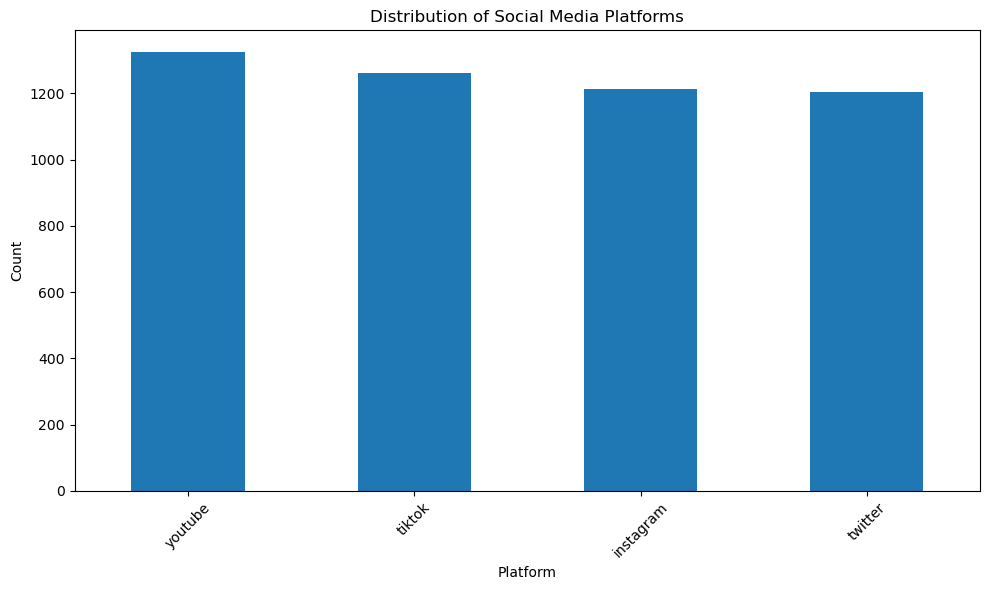

In [87]:
# Visualize platform distribution
plt.figure(figsize=(10, 6))
platform_counts.plot(kind='bar')
plt.title('Distribution of Social Media Platforms')
plt.xlabel('Platform')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('platform_distribution.png')
plt.show()
plt.close()

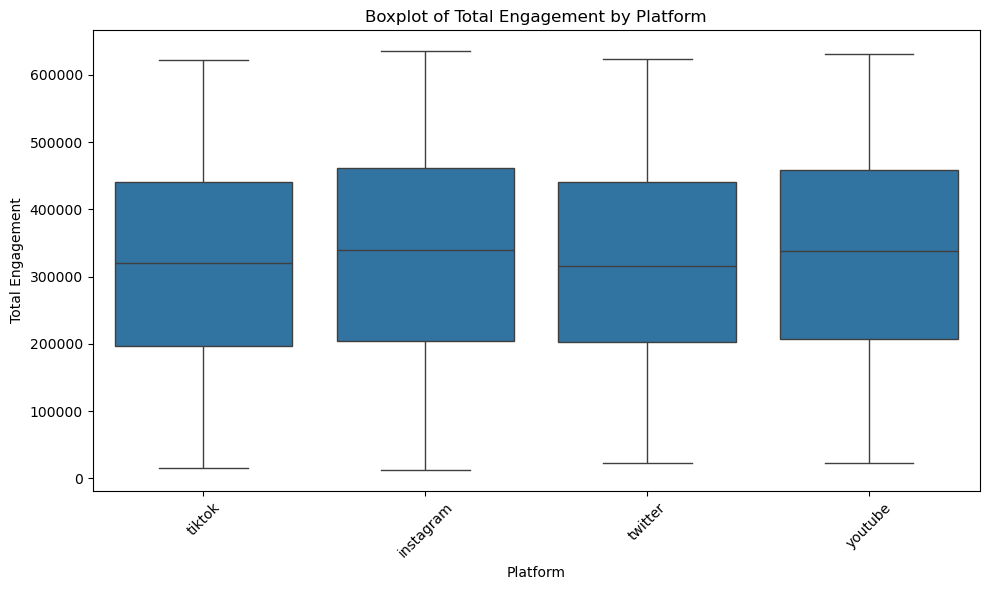

In [89]:
# Box plot: Engagement distribution by platform
df["Total_Engagement"] = df["Likes"] + df["Shares"] + df["Comments"]

plt.figure(figsize=(10, 6))
sns.boxplot(x="Platform", y="Total_Engagement", data=df)
plt.title("Boxplot of Total Engagement by Platform")
plt.ylabel("Total Engagement")
plt.xlabel("Platform")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


### Scatter Plot: Views vs Total Engagement (Bubble = Comments)
This interactive scatter plot compares views and total engagement (likes + shares + comments) across platforms. Each point represents a post, with the bubble size indicating the number of comments. The plot reveals correlation patterns and highlights which platforms tend to generate higher viewer interaction.


### Counting and Ranking Hashtags

This block counts the total number of unique hashtags used in the dataset and then displays the **top 10 most frequent hashtags**. This helps identify which topics or trends are most commonly associated with viral content, giving insight into the most popular themes on social media platforms.


In [93]:
# Count unique hashtags
print(f"\nNumber of unique hashtags: {df['Hashtag'].nunique()}")
print("Top 10 hashtags:")
hashtag_counts = df['Hashtag'].value_counts().head(10)
print(hashtag_counts)


Number of unique hashtags: 10
Top 10 hashtags:
Hashtag
fitness      536
education    525
challenge    507
comedy       505
dance        496
music        493
tech         491
fashion      487
viral        481
gaming       479
Name: count, dtype: int64


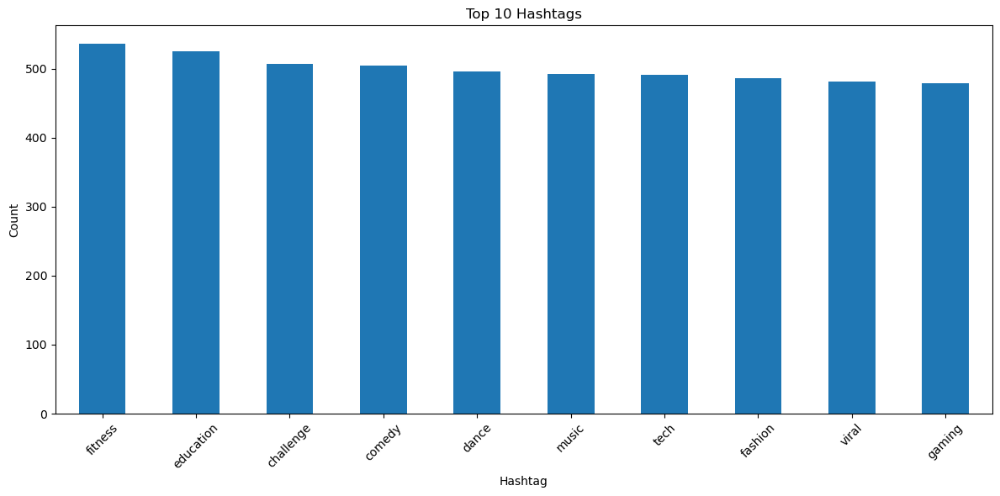

In [95]:
# Visualize top hashtags
plt.figure(figsize=(12, 6))
hashtag_counts.plot(kind='bar')
plt.title('Top 10 Hashtags')
plt.xlabel('Hashtag')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('top_hashtags.png')
plt.show()
plt.close()

### Top 10 Hashtags in Viral Posts
This visualization ranks hashtags by frequency among viral posts. Popular themes like fitness, education, and challenges dominate, highlighting content categories that tend to trend frequently on social media.


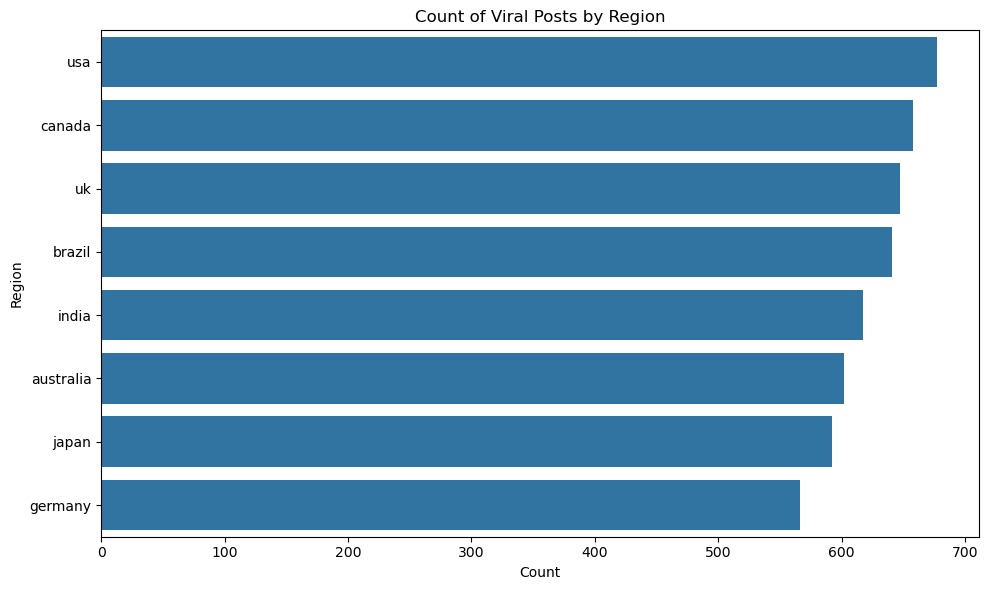

In [98]:
# Count plot: Most frequent regions for viral posts
plt.figure(figsize=(10, 6))
sns.countplot(y="Region", data=df, order=df["Region"].value_counts().index)
plt.title("Count of Viral Posts by Region")
plt.xlabel("Count")
plt.ylabel("Region")
plt.tight_layout()
plt.show()


### Count of Viral Posts by Region
This horizontal count plot shows how many viral posts originate from each region. It provides insights into geographic trends in virality, revealing which countries contribute the most viral content in the dataset.


### Counting and Exploring Content Types

This block counts the number of unique `Content_Type` values and displays how frequently each type appears in the dataset using `value_counts()`. This gives insight into the variety of content formats (e.g., Shorts, Reels, Posts, Live Streams) and helps understand which formats are most commonly associated with viral content.


In [101]:
# Count unique content types
print(f"\nNumber of unique content types: {df['Content_Type'].nunique()}")
print("Content type distribution:")
content_counts = df['Content_Type'].value_counts()
print(content_counts)


Number of unique content types: 6
Content type distribution:
Content_Type
live stream    855
post           853
reel           841
tweet          836
video          828
shorts         787
Name: count, dtype: int64


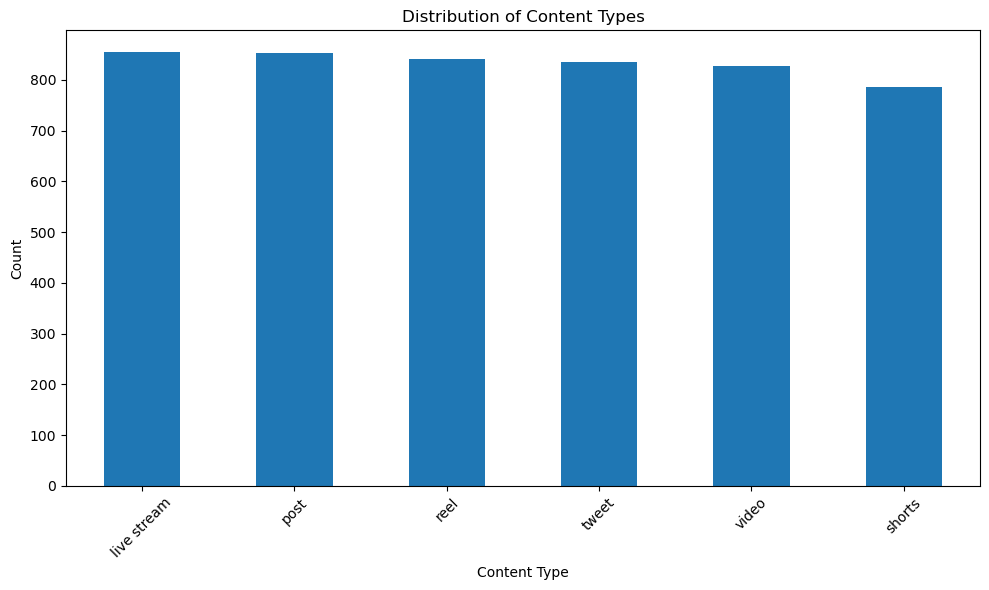

In [103]:
# Visualize content type distribution
plt.figure(figsize=(10, 6))
content_counts.plot(kind='bar')
plt.title('Distribution of Content Types')
plt.xlabel('Content Type')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('content_type_distribution.png')
plt.show()
plt.close()

### Types of Viral Content Formats
This chart shows how different content types contribute to viral posts. Formats like Live Streams, Posts, Shorts, and Reels appear almost evenly, suggesting that no single format guarantees virality — multiple types have high potential.


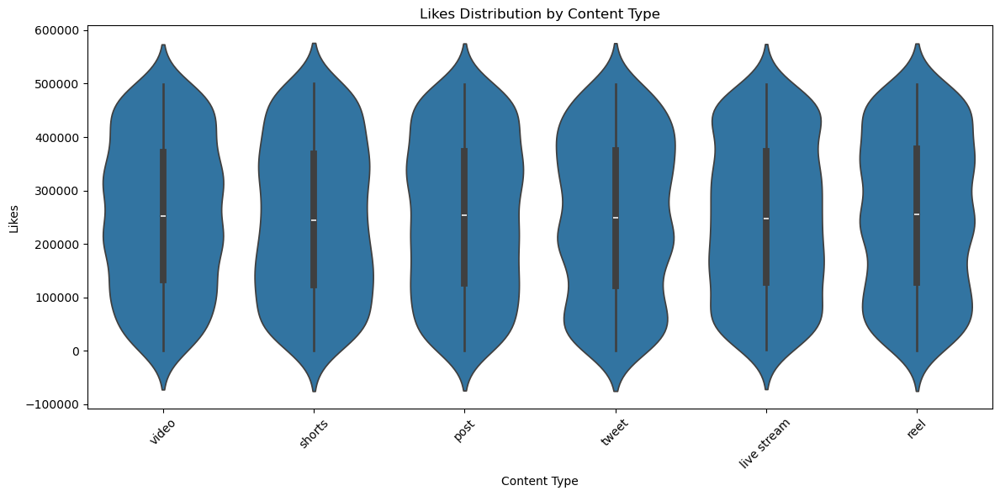

In [106]:
# Violin plot: Likes distribution across content types
plt.figure(figsize=(12, 6))
sns.violinplot(x="Content_Type", y="Likes", data=df)
plt.title("Likes Distribution by Content Type")
plt.xlabel("Content Type")
plt.ylabel("Likes")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


### Violin Plot: Likes by Content Type
This violin plot reveals the distribution of likes for each type of content (e.g., Shorts, Posts, Reels). It shows not only the range but also the density of likes, helping to compare typical performance and variability across content formats.


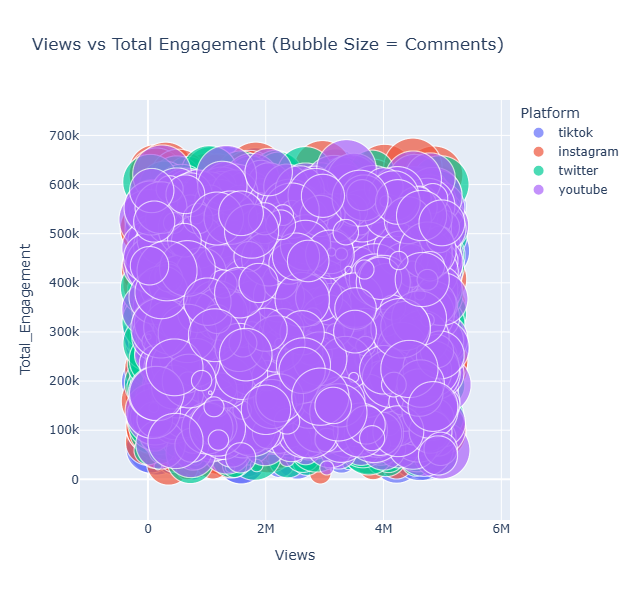

In [109]:
# Scatter plot: Views vs Total Engagement (bubble size = comments)
import plotly.express as px

fig = px.scatter(
    df,
    x="Views",
    y="Total_Engagement",
    color="Platform",
    size="Comments",
    hover_name="Post_ID",
    title="Views vs Total Engagement (Bubble Size = Comments)",
    size_max=60,
    height=600
)
fig.show()


### Scatter Plot: Views vs Total Engagement (Bubble = Comments)
This interactive scatter plot compares views and total engagement (likes + shares + comments) across platforms. Each point represents a post, with the bubble size indicating the number of comments. The plot reveals correlation patterns and highlights which platforms tend to generate higher viewer interaction.


### Section Introduction: Engagement Metrics Distributions

This section introduces an analysis of the distribution patterns for various engagement metrics including views, likes, shares, and comments. Understanding the distribution helps identify whether the data is skewed, whether outliers exist, and how typical or extreme viral interactions are. It provides statistical context before diving into comparisons or visualizations.


In [66]:
# 3. Analyze distributions of engagement metrics
print("\n3. ENGAGEMENT METRICS DISTRIBUTIONS")
print("-"*30)


3. ENGAGEMENT METRICS DISTRIBUTIONS
------------------------------


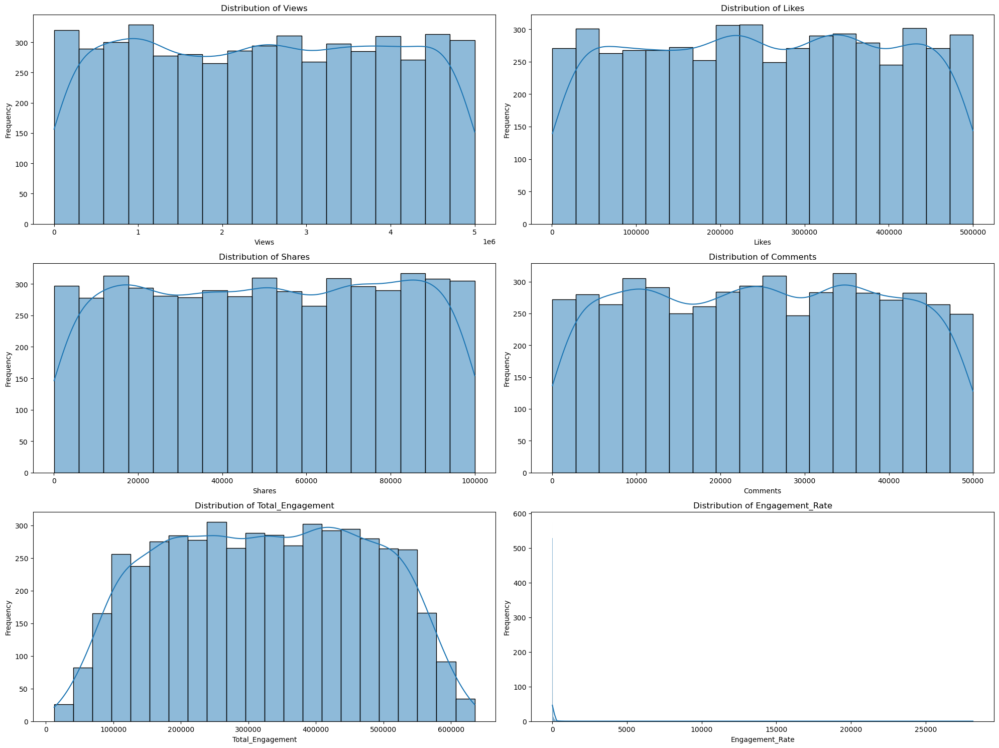

In [68]:
# Create histograms for all engagement metrics
plt.figure(figsize=(20, 15))

for i, metric in enumerate(numeric_columns, 1):
    plt.subplot(3, 2, i)
    sns.histplot(df[metric], kde=True)
    plt.title(f'Distribution of {metric}')
    plt.xlabel(metric)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.savefig('engagement_distributions.png')
plt.show()
plt.close()

### Raw Distributions of Engagement Metrics
This set of histograms displays the frequency distribution of key metrics like views, likes, shares, and comments. All exhibit heavy right-skew, confirming that a few posts receive extremely high engagement while most get modest interaction.


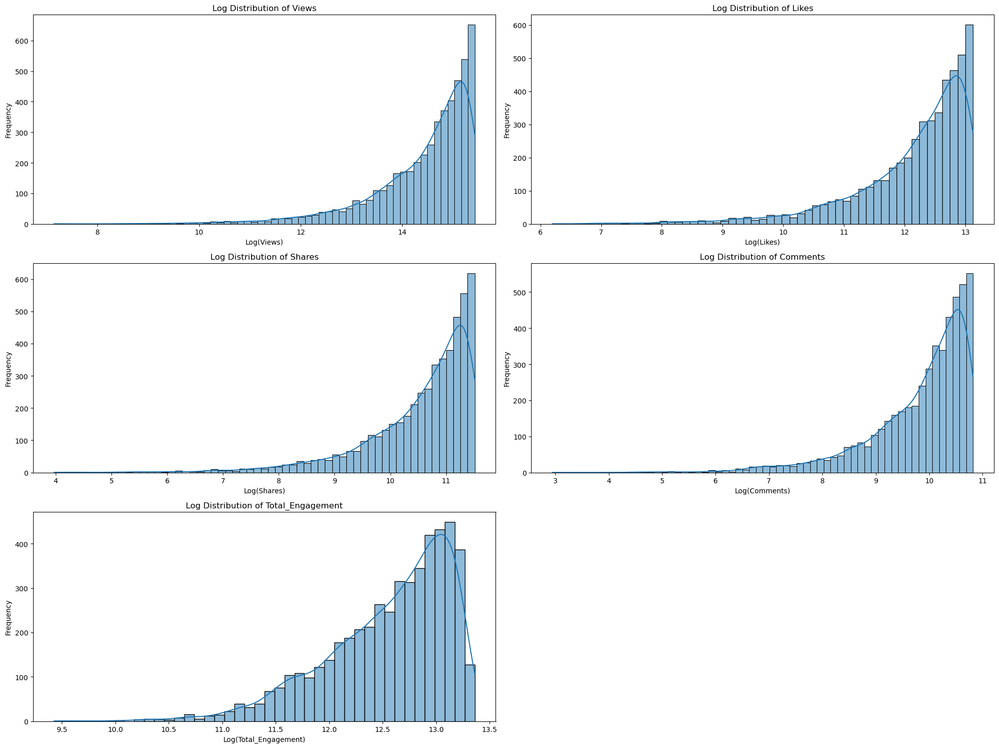

In [69]:
# Log-transformed distributions for better visualization
# Social media metrics often follow power law distributions
plt.figure(figsize=(20, 15))

for i, metric in enumerate(['Views', 'Likes', 'Shares', 'Comments', 'Total_Engagement'], 1):
    plt.subplot(3, 2, i)
    # Add 1 to avoid log(0) issues
    sns.histplot(np.log1p(df[metric]), kde=True)
    plt.title(f'Log Distribution of {metric}')
    plt.xlabel(f'Log({metric})')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()
plt.savefig('log_engagement_distributions.png')
plt.close()

### Log-Scaled Engagement Metrics
Due to the extreme skew in raw data, we apply log transformation to better visualize underlying trends. This reveals clearer patterns and typical engagement levels across posts, helping distinguish high but not extreme values.


### Section Introduction: Most Engaging Content Analysis

This section marks the beginning of an exploration into the most engaging types of content and the platforms that drive high user interaction. It sets the stage for analyzing which combinations of content formats and platforms are most effective in generating views, likes, shares, comments, and high engagement rates.


In [71]:
# 4. Explore most engaging post types and platforms
print("\n4. MOST ENGAGING CONTENT ANALYSIS")
print("-"*30)


4. MOST ENGAGING CONTENT ANALYSIS
------------------------------


### Analyzing Average Engagement Metrics by Platform

This block groups the dataset by `Platform` (e.g., TikTok, Instagram, Twitter, YouTube) and calculates the average of key engagement metrics: likes, shares, comments, views, and engagement rate. It then:

- Sorts the platforms by **Engagement Rate** in descending order.
- Displays which platforms generate the highest viewer interaction on average.

This analysis is essential for understanding where content performs best and which platforms are more likely to yield viral engagement.


In [72]:
# Average engagement by platform
print("\nAverage engagement metrics by platform:")
platform_engagement = df.groupby('Platform')[numeric_columns].mean().sort_values('Engagement_Rate', ascending=False)
print(platform_engagement)


Average engagement metrics by platform:
               Views     Likes   Shares  Comments  Total_Engagement  \
Platform                                                              
instagram 2404079.88 257118.22 50310.91  24958.11         332387.24   
tiktok    2515015.40 244206.72 51468.26  24778.70         320453.67   
youtube   2545648.40 258314.00 50073.09  25321.39         333708.48   
twitter   2506004.59 245880.12 50227.75  24456.86         320564.73   

           Engagement_Rate  
Platform                    
instagram            66.21  
tiktok               63.87  
youtube              50.64  
twitter              46.54  


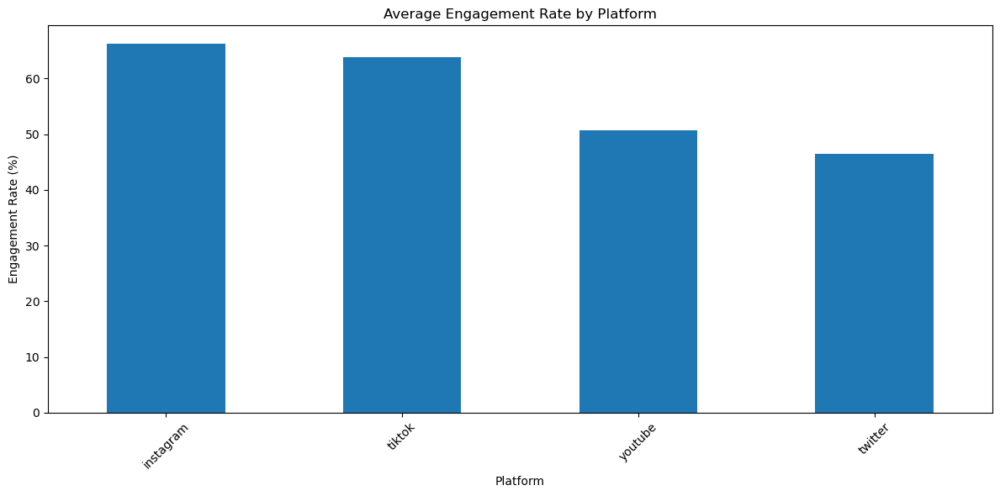

In [73]:
# Visualize platform engagement
plt.figure(figsize=(12, 6))
platform_engagement['Engagement_Rate'].plot(kind='bar')
plt.title('Average Engagement Rate by Platform')
plt.xlabel('Platform')
plt.ylabel('Engagement Rate (%)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()
plt.savefig('platform_engagement.png')
plt.close()

### Platform Engagement Comparison
This chart compares average engagement rates by platform. Instagram and TikTok outperform Twitter and YouTube, suggesting their audiences are more interactive. This reflects the visual and short-form nature of these platforms.


### Analyzing Average Engagement Metrics by Content Type

This block groups the dataset by `Content_Type` and computes the average values for all engagement-related metrics (likes, shares, comments, views, and engagement rate). It then:

- Sorts the results by **Engagement Rate** in descending order.
- Displays which content formats (e.g., Shorts, Reels, Posts) are most effective at engaging viewers.

This analysis helps identify the most engaging formats overall and informs content creation strategies for higher interaction.


In [74]:
# Average engagement by content type
print("\nAverage engagement metrics by content type:")
content_engagement = df.groupby('Content_Type')[numeric_columns].mean().sort_values('Engagement_Rate', ascending=False)
print(content_engagement)


Average engagement metrics by content type:
                  Views     Likes   Shares  Comments  Total_Engagement  \
Content_Type                                                             
shorts       2486350.72 247926.20 49593.95  25060.41         322580.57   
live stream  2481009.01 248811.62 49921.96  25167.64         323901.21   
tweet        2500386.93 249384.47 51427.45  24635.99         325447.91   
post         2474337.32 252784.17 50164.20  24554.97         327503.34   
video        2489008.86 254768.92 50614.39  24694.61         330077.93   
reel         2533268.68 255011.07 51357.87  25223.41         331592.34   

              Engagement_Rate  
Content_Type                   
shorts                  80.63  
live stream             61.88  
tweet                   52.07  
post                    49.81  
video                   48.82  
reel                    48.75  


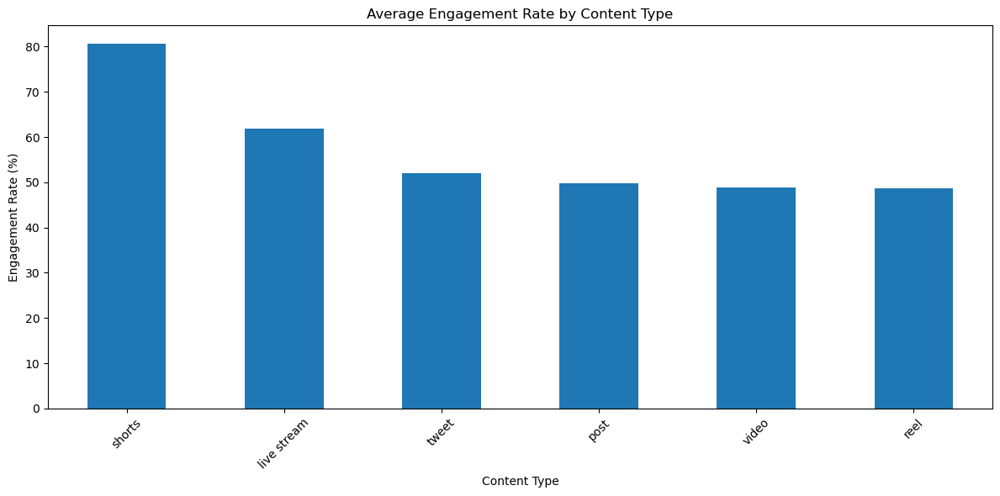

In [75]:
# Visualize content type engagement
plt.figure(figsize=(12, 6))
content_engagement['Engagement_Rate'].plot(kind='bar')
plt.title('Average Engagement Rate by Content Type')
plt.xlabel('Content Type')
plt.ylabel('Engagement Rate (%)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()
plt.savefig('content_engagement.png')
plt.close()

### Engagement by Content Type
Shorts show the highest engagement rate, followed by live streams. This suggests viewers engage more with brief or real-time content. Static posts and traditional videos see lower engagement, emphasizing the value of dynamic formats.


### Analyzing Average Engagement Metrics for Top Hashtags

This block groups the dataset by `Hashtag` and calculates the average values for all numeric engagement metrics (e.g., Likes, Shares, Comments, Engagement Rate). It then:

- Sorts the hashtags by **Engagement Rate** in descending order.
- Displays the **top 10 hashtags** based on their ability to generate user interaction relative to views.

This analysis reveals which hashtags are most effective at driving audience engagement, offering strategic insights into content tagging for better virality.


In [76]:
# Average engagement by hashtag (top 10)
print("\nAverage engagement metrics by top hashtags:")
hashtag_engagement = df.groupby('Hashtag')[numeric_columns].mean().sort_values('Engagement_Rate', ascending=False).head(10)
print(hashtag_engagement)


Average engagement metrics by top hashtags:
               Views     Likes   Shares  Comments  Total_Engagement  \
Hashtag                                                               
viral     2437590.28 249964.49 50428.89  24776.51         325169.90   
comedy    2450141.71 253615.75 49418.05  24798.89         327832.68   
gaming    2500698.95 242819.59 51360.82  25332.24         319512.65   
fitness   2599391.00 253130.12 51183.12  24532.69         328845.94   
tech      2516381.46 260347.15 48287.21  25799.55         334433.91   
education 2531227.84 260423.42 51748.70  24684.92         336857.05   
fashion   2426830.62 249970.58 50956.94  24206.32         325133.85   
dance     2447362.77 254484.89 49557.96  24565.04         328607.89   
challenge 2451335.16 241212.44 51182.43  25207.85         317602.72   
music     2568758.78 248012.82 50965.63  25024.50         324002.94   

           Engagement_Rate  
Hashtag                     
viral               100.47  
comedy         

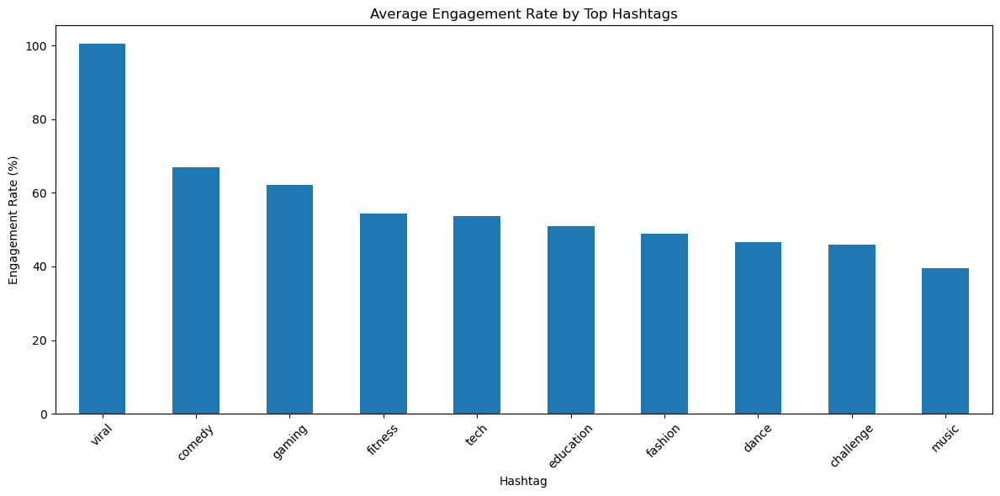

In [78]:
# Visualize hashtag engagement
plt.figure(figsize=(12, 6))
hashtag_engagement['Engagement_Rate'].plot(kind='bar')
plt.title('Average Engagement Rate by Top Hashtags')
plt.xlabel('Hashtag')
plt.ylabel('Engagement Rate (%)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()
plt.savefig('hashtag_engagement.png')
plt.close()

### Hashtag vs. Engagement Rate
This bar chart compares average engagement rates for top hashtags. While hashtags like #Fitness are frequent, tags like #Viral have significantly higher interaction rates, indicating that how a post is labeled can affect engagement intensity.


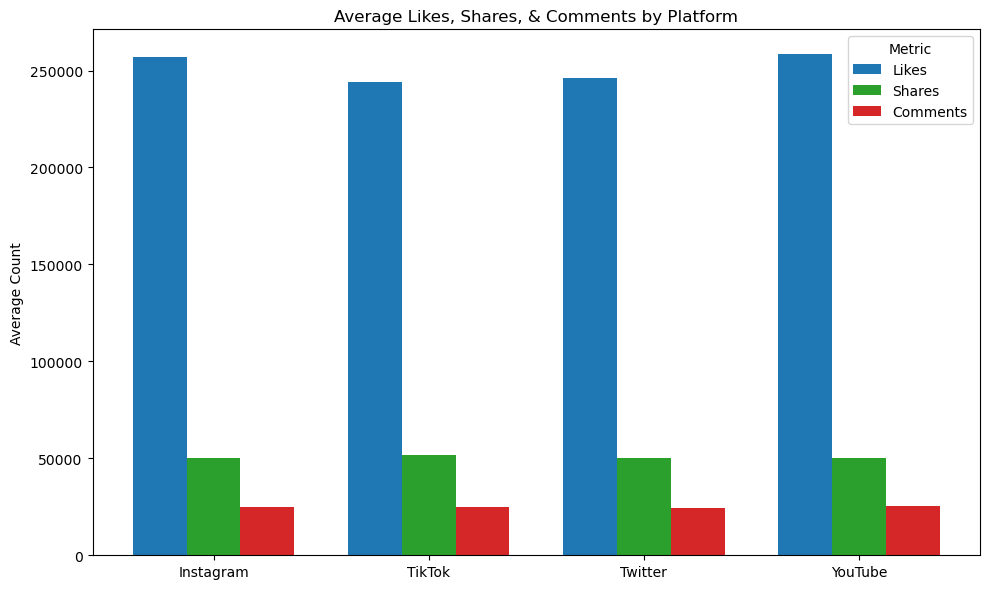

In [132]:
# Load and group the data
df = pd.read_csv('Viral_Social_Media_Trends.csv')
df_avg = df.groupby('Platform')[['Likes', 'Shares', 'Comments']].mean().reset_index()

# Prepare data
labels = df_avg['Platform']
likes = df_avg['Likes']
shares = df_avg['Shares']
comments = df_avg['Comments']
x = np.arange(len(labels))
width = 0.25

# Use distinct colors for each metric
color_likes = '#1f77b4'     # blue
color_shares = '#2ca02c'    # green
color_comments = '#d62728'  # red

# Plot
fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(x - width, likes, width, label='Likes', color=color_likes)
ax.bar(x, shares, width, label='Shares', color=color_shares)
ax.bar(x + width, comments, width, label='Comments', color=color_comments)

# Final touches
ax.set_ylabel('Average Count')
ax.set_title('Average Likes, Shares, & Comments by Platform')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend(title='Metric')

plt.tight_layout()
plt.show()


### Average Interactions by Platform
This grouped bar chart compares the average number of likes, shares, and comments per post for each platform. TikTok and Instagram tend to receive higher interaction rates, highlighting platform-specific engagement norms.


In [88]:
# 5. Platform and Content Type Analysis
print("\n5. PLATFORM AND CONTENT TYPE RELATIONSHIPS")
print("-"*30)


5. PLATFORM AND CONTENT TYPE RELATIONSHIPS
------------------------------


### Creating Frequency Table: Platform vs Content Type Counts

This block uses `pd.crosstab()` to generate a contingency table that counts how many viral posts exist for each combination of **platform** and **content type**. 

- **Rows (`index`)**: Social media platforms (e.g., YouTube, TikTok).
- **Columns (`columns`)**: Content types (e.g., Reels, Shorts, Posts).
- **Cell Values**: The number of viral posts for each platform–content pair.

This count matrix is useful for visualizing which platforms favor which content types, and serves as the foundation for a heatmap that can show relative frequency or distribution density.


In [90]:
# Create a heatmap of platform vs content type counts
platform_content_counts = pd.crosstab(df['Platform'], df['Content_Type'])
print("\nPlatform vs Content Type counts:")
print(platform_content_counts)


Platform vs Content Type counts:
Content_Type  live stream  post  reel  shorts  tweet  video
Platform                                                   
instagram             211   191   214     196    188    212
tiktok                207   203   210     208    218    214
twitter               206   221   202     166    211    198
youtube               231   238   215     217    219    204


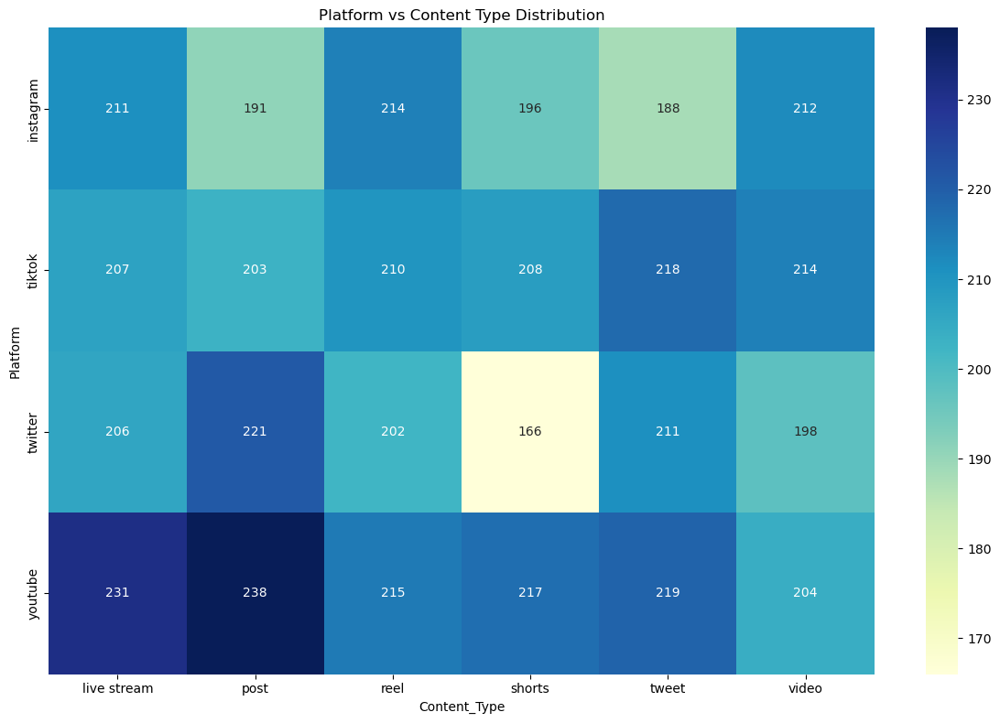

In [92]:
# Visualize as heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(platform_content_counts, annot=True, cmap='YlGnBu', fmt='d')
plt.title('Platform vs Content Type Distribution')
plt.tight_layout()
plt.show()
plt.savefig('platform_content_heatmap.png')
plt.close()

### Heatmap of Post Counts by Platform & Format
This heatmap shows which content formats dominate on each platform. For example, Reels and Shorts are more prevalent on Instagram and YouTube respectively. It helps correlate format popularity with platform design.


### Preparing Heatmap: Average Engagement Rate by Platform and Content Type

This block creates a pivot table that calculates the **average engagement rate** for each combination of social media platform and content type. Here's how it works:

- **Index**: `Platform` – groups the data by platform (e.g., TikTok, Instagram).
- **Columns**: `Content_Type` – breaks down engagement rates by content format (e.g., Reels, Shorts).
- **Values**: `Engagement_Rate` – uses the mean of this metric to compare performance.

The resulting table allows for easy visual comparison of how well different types of content perform on each platform, setting up for a heatmap visualization that highlights high- and low-performing combinations.


In [95]:
# Create a heatmap of average engagement rate by platform and content type
platform_content_engagement = df.pivot_table(
    index='Platform', 
    columns='Content_Type', 
    values='Engagement_Rate', 
    aggfunc='mean'
)
print("\nAverage engagement rate by platform and content type:")
print(platform_content_engagement)


Average engagement rate by platform and content type:
Content_Type  live stream  post  reel  shorts  tweet  video
Platform                                                   
instagram           93.34 53.64 67.87   69.01  83.43  30.98
tiktok              30.95 39.66 32.56  168.91  44.70  66.83
twitter             32.75 43.98 45.90   54.16  46.73  57.82
youtube             86.83 60.79 48.23   26.74  37.62  39.72


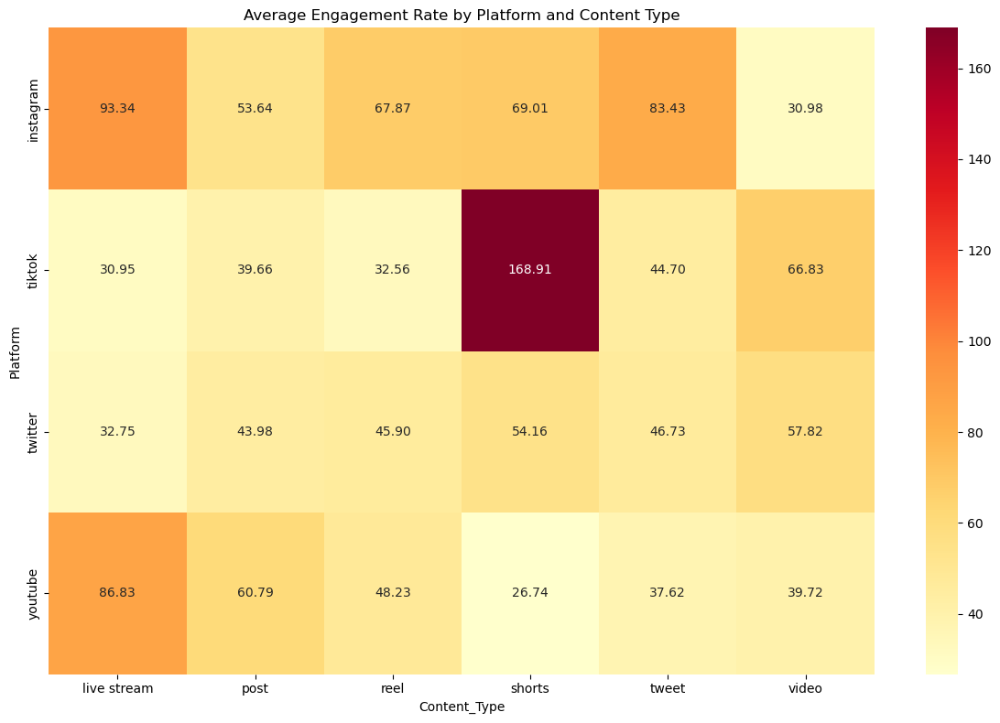

In [97]:
# Visualize as heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(platform_content_engagement, annot=True, cmap='YlOrRd', fmt='.2f')
plt.title('Average Engagement Rate by Platform and Content Type')
plt.tight_layout()
plt.show()
plt.savefig('platform_content_engagement_heatmap.png')
plt.close()

### Heatmap of Engagement Rate Across Platforms & Formats
This matrix combines platform and content type to analyze which combinations yield the highest engagement. Shorts on Instagram or TikTok may drive significantly higher engagement compared to static posts on Twitter.


### Identifying Top Performing Posts

This section highlights the most successful viral posts based on two key performance metrics:

1. **Total Engagement**: The sum of likes, shares, and comments for each post.  
   - The dataset is sorted in descending order of `Total_Engagement` and the top 10 posts are displayed.
   - These posts represent the highest overall interaction volumes, regardless of how many people viewed them.

2. **Engagement Rate**: Calculated as the percentage of viewers who interacted with a post.  
   - Sorting by `Engagement_Rate` reveals posts that were exceptionally engaging relative to their view count.
   - These posts might not have the highest reach but are the most efficient at driving user interaction.

This analysis provides insights into which posts achieved broad popularity versus which posts deeply engaged their audiences.


In [100]:
# 6. Top performing posts
print("\n6. TOP PERFORMING POSTS")
print("-"*30)

# Top 10 posts by total engagement
print("\nTop 10 posts by total engagement:")
top_engagement = df.sort_values('Total_Engagement', ascending=False).head(10)
print(top_engagement[['Post_ID', 'Platform', 'Content_Type', 'Hashtag', 'Total_Engagement', 'Views']])

# Top 10 posts by engagement rate
print("\nTop 10 posts by engagement rate:")
top_rate = df.sort_values('Engagement_Rate', ascending=False).head(10)
print(top_rate[['Post_ID', 'Platform', 'Content_Type', 'Hashtag', 'Engagement_Rate', 'Views']])


6. TOP PERFORMING POSTS
------------------------------

Top 10 posts by total engagement:
        Post_ID   Platform Content_Type    Hashtag  Total_Engagement    Views
2907  Post_2908  instagram  live stream  challenge            635139  4498056
4960  Post_4961  instagram        tweet       tech            630930  2964544
3619  Post_3620    youtube         reel      dance            630822  3371356
1871  Post_1872  instagram       shorts       tech            630436   301575
556    Post_557  instagram         post    fitness            627178   129205
2864  Post_2865  instagram         reel      viral            626538  1831119
4759  Post_4760    youtube        tweet      music            625382  2050005
2492  Post_2493    twitter         reel    fashion            624224  3802774
3016  Post_3017    twitter        tweet    fashion            622586  1072473
8        Post_9    twitter  live stream  education            622293  2169523

Top 10 posts by engagement rate:
        Post_ID  

### Final Dataset Summary

This block provides a final overview of the dataset after all cleaning and transformations.  
- `df.shape` returns the number of rows and columns, confirming the dataset size.  
- `df.info()` shows the data types and non-null counts for each column.

This final check ensures that all expected modifications (e.g., removal of duplicates, handling of missing values, and data type consistency) were successfully applied before saving or analyzing the data further.


In [102]:
# Final dataset summary
print("\nFinal dataset shape:", df.shape)
print("\nFinal dataset information:")
print(df.info())
# Justification: After all transformations, it's important to review the final
# dataset structure to ensure all changes were applied as expected.


Final dataset shape: (5000, 12)

Final dataset information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Post_ID           5000 non-null   object 
 1   Platform          5000 non-null   object 
 2   Hashtag           5000 non-null   object 
 3   Content_Type      5000 non-null   object 
 4   Region            5000 non-null   object 
 5   Views             5000 non-null   int64  
 6   Likes             5000 non-null   int64  
 7   Shares            5000 non-null   int64  
 8   Comments          5000 non-null   int64  
 9   Engagement_Level  5000 non-null   object 
 10  Total_Engagement  5000 non-null   int64  
 11  Engagement_Rate   5000 non-null   float64
dtypes: float64(1), int64(5), object(6)
memory usage: 468.9+ KB
None


### Final Check for Missing Values

This block performs a final validation by printing the count of missing values in each column using `df.isnull().sum()`. This step ensures that all missing data has been properly handled during cleaning. Confirming that no missing values remain is essential to guarantee the dataset's integrity before proceeding with analysis or visualization.


In [104]:
# Check if there are any remaining missing values
print("\nRemaining missing values:")
print(df.isnull().sum())
# Justification: Confirming no missing values remain ensures that the dataset
# is complete and ready for analysis. This is a final quality check.


Remaining missing values:
Post_ID             0
Platform            0
Hashtag             0
Content_Type        0
Region              0
Views               0
Likes               0
Shares              0
Comments            0
Engagement_Level    0
Total_Engagement    0
Engagement_Rate     0
dtype: int64


### Saving the Cleaned Dataset

After performing data cleaning and transformation, the dataset is saved to a new CSV file called `Viral_Social_Media_Trends_Cleaned.csv`. The `index=False` argument ensures that the DataFrame index is not written as an additional column in the file. This step preserves the cleaned version of the data, allowing for easy reuse in further analysis or visualizations without redoing the preprocessing steps.


In [106]:
# Save the cleaned dataset
df.to_csv('Viral_Social_Media_Trends_Cleaned.csv', index=False)
print("Cleaned dataset saved as 'Viral_Social_Media_Trends_Cleaned.csv'")
# Justification: Saving the cleaned dataset preserves the work done and creates
# a clean version for further analysis. Not including the index (index=False)
# avoids adding an unnecessary column to the saved file. 

Cleaned dataset saved as 'Viral_Social_Media_Trends_Cleaned.csv'


### Importing Libraries and Loading the Dataset

In this block, we import the required libraries:
- `pandas` for data manipulation and analysis.
- `plotly.express` for creating interactive visualizations.

We then load the dataset `Viral_Social_Media_Trends.csv` into a DataFrame named `df_trends`. The `df_trends.head()` function is used to display the first five rows of the dataset, which helps quickly inspect the structure, column names, and sample data before beginning analysis.


In [114]:
import pandas as pd
import plotly.express as px

# Load the Viral Social Media Trends dataset
df_trends = pd.read_csv('Viral_Social_Media_Trends.csv')

# Display first few rows
df_trends.head()

,Post_ID,Platform,Hashtag,Content_Type,Region,Views,Likes,Shares,Comments,Engagement_Level
0,Post_1,TikTok,#Challenge,Video,UK,4163464,339431,53135,19346,High
1,Post_2,Instagram,#Education,Shorts,India,4155940,215240,65860,27239,Medium
2,Post_3,Twitter,#Challenge,Video,Brazil,3666211,327143,39423,36223,Medium
3,Post_4,YouTube,#Education,Shorts,Australia,917951,127125,11687,36806,Low
4,Post_5,TikTok,#Dance,Post,Brazil,64866,171361,69581,6376,Medium


### Animated Geo Map: Viral Post Views by Region and Engagement Level

This section first groups the dataset by `Region` and `Engagement_Level`, calculating the mean values for key metrics — views, likes, shares, and comments — for each group. This aggregation helps summarize regional performance across different levels of engagement.

The grouped data is then visualized using a **Plotly animated scatter geo map**. Each frame of the animation represents a different engagement level (e.g., Low, Medium, High). Bubbles on the map are sized based on the average number of **likes** and colored by the average number of **views**, providing a visual representation of global engagement intensity.

- **X-Axis**: Longitude (inferred from region)
- **Y-Axis**: Latitude (inferred from region)
- **Bubble size**: Average Likes
- **Color gradient**: Average Views
- **Frames**: Engagement Levels (Low, Medium, High)

This visualization effectively showcases which regions generate the most viral activity and how engagement metrics vary by geographic area and audience behavior.


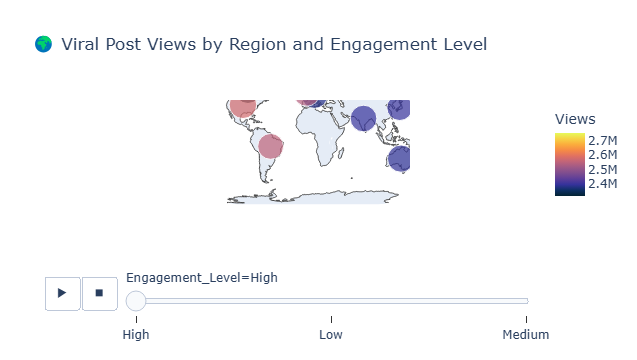

In [116]:

# Group data for Geo Map
df_geo = df_trends.groupby(['Region', 'Engagement_Level']).agg({
    'Views': 'mean',
    'Likes': 'mean',
    'Shares': 'mean',
    'Comments': 'mean'
}).reset_index()

# Animated Scatter Geo Map
fig_geo = px.scatter_geo(df_geo,
                         locations="Region",
                         locationmode='country names',
                         color="Views",
                         hover_name="Region",
                         size="Likes",
                         animation_frame="Engagement_Level",
                         projection="natural earth",
                         title='🌍 Viral Post Views by Region and Engagement Level',
                         color_continuous_scale="thermal",
                         range_color=(df_geo['Views'].min(), df_geo['Views'].max()),
                         height=600)

fig_geo.update_layout(geo=dict(showframe=False, showcoastlines=True))
fig_geo.show()


### Geo Visualization: Viral Views by Region and Engagement Level
This animated scatter geo map displays the average number of views (color) and likes (bubble size) across different world regions, categorized by engagement level. Each frame of the animation represents a different level of engagement (e.g., Low, Medium, High). The visualization helps reveal which regions are hotspots for viral content and how their average interactions vary by intensity of engagement. The use of geographic mapping gives a clear global perspective on where high-performing content tends to emerge.


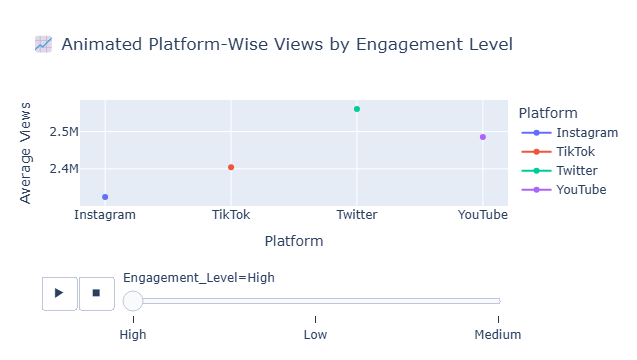

In [118]:

# Group data for Line Chart
df_line = df_trends.groupby(['Platform', 'Engagement_Level']).agg({
    'Views': 'mean',
    'Likes': 'mean',
    'Shares': 'mean',
    'Comments': 'mean'
}).reset_index()

# Animated Line Chart
fig_line = px.line(df_line,
                   x='Platform',
                   y='Views',
                   color='Platform',
                   animation_frame='Engagement_Level',
                   markers=True,
                   title='📈 Animated Platform-Wise Views by Engagement Level',
                   labels={'Views': 'Average Views'},
                   height=600)

fig_line.update_layout(transition={'duration': 500})
fig_line.show()


### Animated Line Chart: Platform-Wise Views by Engagement Level
This animated line chart illustrates how the average number of views varies across social media platforms based on engagement level (e.g., Low, Medium, High). Each frame of the animation corresponds to a different engagement tier, allowing us to track how platforms like TikTok, YouTube, Instagram, and Twitter perform as engagement intensity increases. This visualization helps compare platform performance dynamically and reveals trends in content viewership across varying engagement contexts.


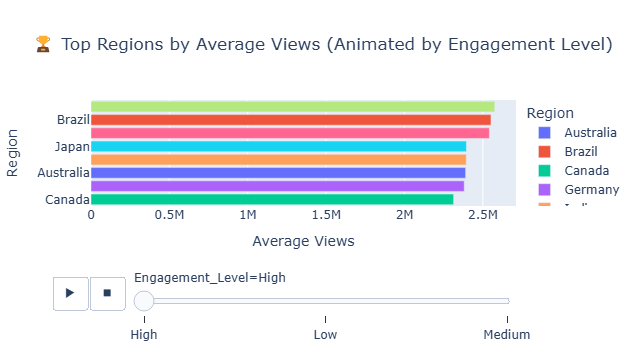

In [120]:

# Animated Bar Chart
fig_bar = px.bar(df_geo,
                 x='Views',
                 y='Region',
                 color='Region',
                 orientation='h',
                 animation_frame='Engagement_Level',
                 title='🏆 Top Regions by Average Views (Animated by Engagement Level)',
                 labels={'Views': 'Average Views'},
                 height=600)

fig_bar.update_layout(transition={'duration': 500}, yaxis={'categoryorder':'total ascending'})
fig_bar.show()


### Animated Bar Chart: Top Regions by Average Views (Grouped by Engagement Level)
This horizontal animated bar chart shows the top regions based on their average views, animated by engagement level. As the engagement level changes (Low, Medium, High), we can observe how regional performance shifts. This dynamic visualization effectively highlights which countries consistently generate high viewership and how virality varies geographically with engagement intensity. The horizontal format helps compare viewership magnitude clearly across regions.


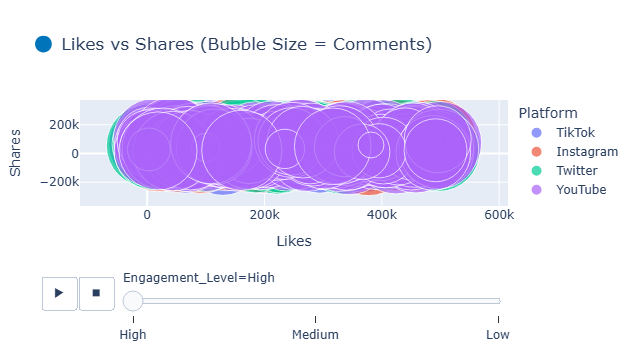

In [122]:

# Animated Bubble Chart
fig_bubble = px.scatter(df_trends,
                        x='Likes',
                        y='Shares',
                        size='Comments',
                        color='Platform',
                        hover_name='Post_ID',
                        animation_frame='Engagement_Level',
                        title='🔵 Likes vs Shares (Bubble Size = Comments)',
                        size_max=60,
                        height=600)

fig_bubble.update_layout(transition={'duration': 500})
fig_bubble.show()


### Animated Bubble Chart: Likes vs. Shares by Platform (Bubble Size = Comments)
This animated bubble chart plots Likes vs. Shares for viral posts, where the size of each bubble represents the number of Comments. Each bubble is colored by platform, and the animation shows how these relationships shift across engagement levels. This visualization helps us understand interaction dynamics across platforms—how likes and shares correlate, and which platforms tend to generate more comments at different levels of engagement.


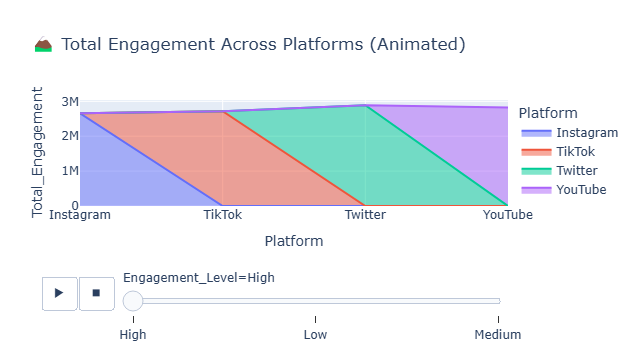

In [126]:

# Prepare data for Area Chart
df_trends['Total_Engagement'] = df_trends['Views'] + df_trends['Likes'] + df_trends['Shares'] + df_trends['Comments']
df_area = df_trends.groupby(['Platform', 'Engagement_Level']).agg({
    'Total_Engagement': 'mean'
}).reset_index()

# Animated Area Chart
fig_area = px.area(df_area,
                   x='Platform',
                   y='Total_Engagement',
                   color='Platform',
                   animation_frame='Engagement_Level',
                   title='🏔️ Total Engagement Across Platforms (Animated)',
                   height=600)

fig_area.update_layout(transition={'duration': 500})
fig_area.show()


### Animated Area Chart: Total Engagement Across Platforms
This animated area chart visualizes the average total engagement (sum of views, likes, shares, and comments) across platforms, grouped by engagement level. The animation shows how overall interaction volume changes as engagement intensity increases. This chart provides a clear comparison of how platforms like TikTok, YouTube, Instagram, and Twitter perform in terms of total user interaction, emphasizing which platforms dominate in viral reach and engagement over time.


## Conclusion and Insights

Our analysis of 5,000 viral social media posts across YouTube, Instagram, TikTok, and Twitter reveals the following key insights:

- **Short-form videos** such as **Shorts** have the highest engagement rate (~80.6%), making them the most impactful format for virality.
- **Instagram** and **TikTok** show the strongest viewer interaction rates (66.2% and 63.9%, respectively), highlighting their dominance in the attention economy.
- **Hashtags** like `#Fitness`, `#Education`, and `#Challenge` are common in viral content, but `#Viral` stands out for its exceptionally high engagement.
- **Content type and platform significantly influence virality**, meaning that creators should tailor their strategies based on the intended platform.
- **Even outliers and extreme values** in engagement (like >100% engagement rates) are meaningful for understanding viral phenomena.

In short, virality is driven by a mix of **platform dynamics, content format, and audience behavior**. Content creators can increase their odds of success by aligning their posts with trending topics, using immersive formats like short videos, and optimizing for platform-specific engagement styles.
